<a href="https://colab.research.google.com/github/udaydinesh204/Computer_Vision/blob/main/Image_processing_with_Pillow(PIL).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Objectives
Image processing and computer vision tasks include displaying, cropping, flipping, rotating, image segmentation, classification, image restoration, image recognition, image generation. Also, working with images via the cloud requires storing and transmitting, and gathering images through the internet. Python is an excellent choice as it has many image processing tools, computer vision, and artificial intelligence libraries.

Open CV


*   Image Files and Paths
*   Load in Image in Python
*   Plotting an Image
*   Gray Scale Images, Quantization and Color Channels


In [1]:
!wget https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/lenna.png -O lenna.png
!wget https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/baboon.png -O baboon.png
!wget https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/barbara.png -O barbara.png

--2023-08-18 10:20:00--  https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/lenna.png
Resolving cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud (cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud)... 198.23.119.245
Connecting to cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud (cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud)|198.23.119.245|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 473831 (463K) [image/png]
Saving to: ‘lenna.png’

lenna.png           100%[===================>] 462.73K  1.19MB/s    in 0.4s    

2023-08-18 10:20:01 (1.19 MB/s) - ‘lenna.png’ saved [473831/473831]

--2023-08-18 10:20:01--  https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/baboon.png
Resolving cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud (cf-cours

In [2]:
def get_concat_h(im1 , im2):
  #https://note.nkmk.me/en/python-pillow-concat-images/
  dst = Image.new('RGB', (im1.width + im2.width , im1.height))
  dst.paste(im1,(0,0))
  dst.paste(im2, (im1.width,0))
  return dst

## Image Files and Paths

An image is stored as a file on your computer. Below, we define my_image as the filename of a file in this directory.

A filename consists of two parts: the name of the file and the extension, separated by a full stop (.). The extension specifies the format of the Image. There are two popular image formats: Joint Photographic Expert Group image (or .jpg, .jpeg) and Portable Network Graphics (or .png). These file types make it simpler to work with images. For example, it compresses the image, taking less spaces on your drive to store the image.

Image files are stored in the file system of your computer. The location of it is specified using a "path", which is often unique. You can find the path of your current working directory with Python's os module. The os module provides functions to interact with the file system, e.g. creating or removing a directory (folder), listing its contents, changing and identifying the current working directory.


In [3]:
my_image = "lenna.png"

In [4]:
import os
cwd = os.getcwd()
cwd

'/content'

In [5]:
image_path = os.path.join(cwd, my_image)
image_path

'/content/lenna.png'

## Load Image in python
Pillow (PIL) library is a popular library for loading images in Python. In addition, many other libraries such as "Keras" and "PyTorch" use this library to work with images. The Image module provides functions to load images from and saving images to the file system. Let's import it from PIL.

In [6]:
from PIL import Image

If the image is in the current working directory, you can load the image as follows using the image's filename and create a PIL Image object:

In [7]:
image = Image.open(my_image)
type(image)

PIL.PngImagePlugin.PngImageFile

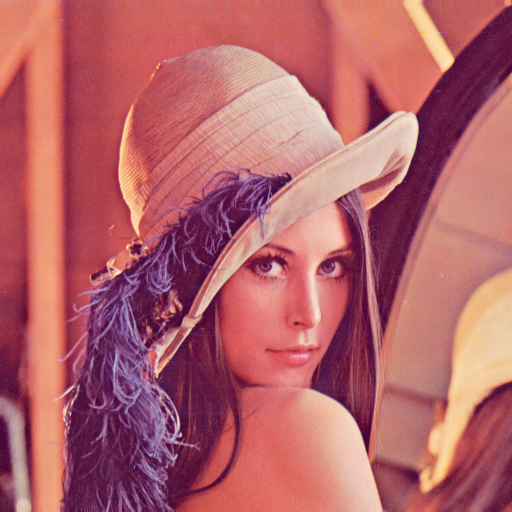

In [8]:
image

## Plotting an Image

We can also use the method show of PIL objects to display the image. Please note this method may or may not work depending on your setup.

In [9]:
image.show()

You can also use imshow method from the matplotlib library to display the image.

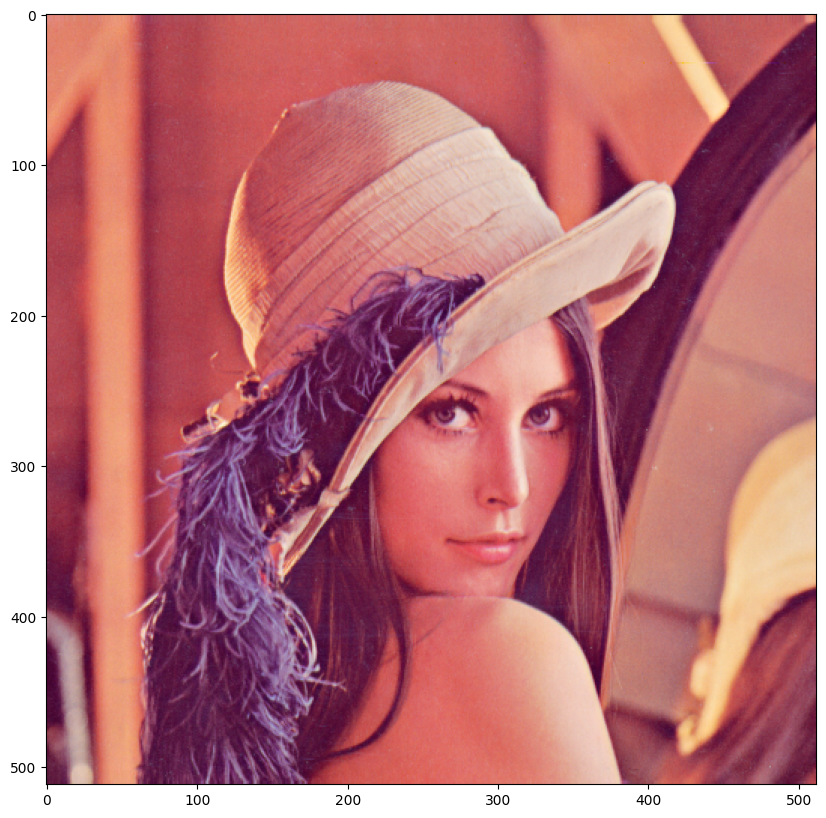

In [10]:
import matplotlib.pyplot as plt
plt.figure(figsize=(10,10))
plt.imshow(image)
plt.show()

You can also load the image using its full path. This comes in handy if the image is not in your working directory.

In [11]:
image = Image.open(image_path)

We can use the attributes of the image object to get information. The attribute format is the extension or format of the image.

The attribute size returns a tuple, the first element is the number of pixels that comprise the width and the second element is the number of pixels that make up the height of the image.

In [12]:
print(image.size)

(512, 512)


This is a string specifying the pixel format used. In this case, it's “RGB”. RGB is a color space where red, green, and blue are added together to produce other colors.

In [13]:
print(image.mode)

RGB


The Image.open method does not load image data into the computer memory. The load method of PIL object reads the file content, decodes it, and expands the image into memory.

In [14]:
im = image.load()

We can then check the intensity of the image at the  𝑥
 -th column and  𝑦
 -th row:

In [15]:
x=0
y=1
im[y,x]

(226, 137, 125)

We will use the array form to access the elements; it is slightly different.

You can save the image in jpg format using the following command.

In [16]:
image.save('lenna.jpg')

## Grayscale Images, Quantization and Color Channels¶

### Grayscale Images
The ImageOps module contains several ‘ready-made’ image processing operations. This module is somewhat experimental, and most operators only work with grayscale and/or RGB images.

In [17]:
from PIL import ImageOps

Grayscale images have pixel values representing the amount of light or intensity of that pixel. Light shades of gray have a high-intensity while darker shades have a lower intensity, i.e, white has the highest intensity and black the lowest.

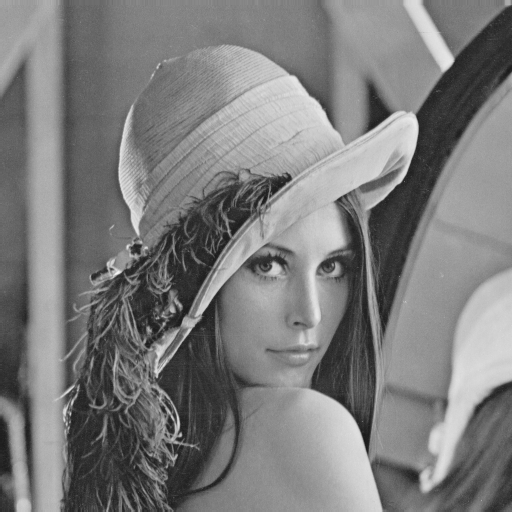

In [18]:
image_gray = ImageOps.grayscale(image)
image_gray

The Mode is L for grayscale

In [19]:
image_gray.mode

'L'

## Quantization
The Quantization of an image is the number of unique intensity values any given pixel of the image can take. For a grayscale image, this means the number of different shades of gray. Most images have 256 different levels. You can decrease the levels using the method quantize. Let's repeatably cut the number of levels in half and observe what happens:

Half the level do not make a noticable difference

In [20]:
image_gray.quantize(256//2)
image_gray.show()

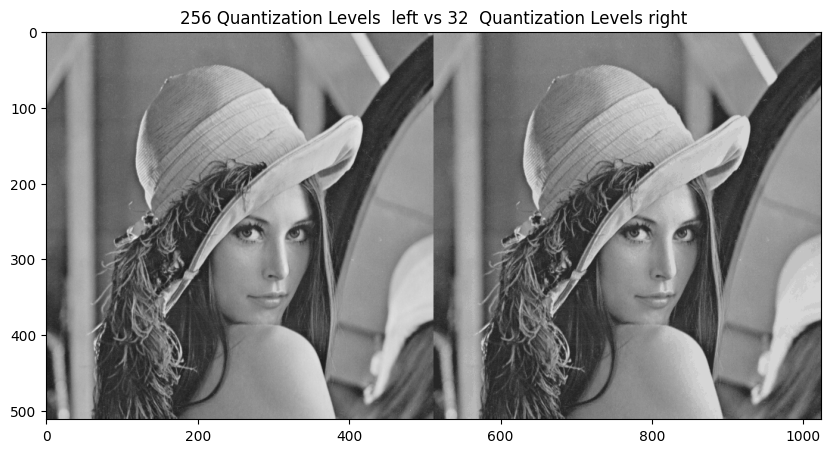

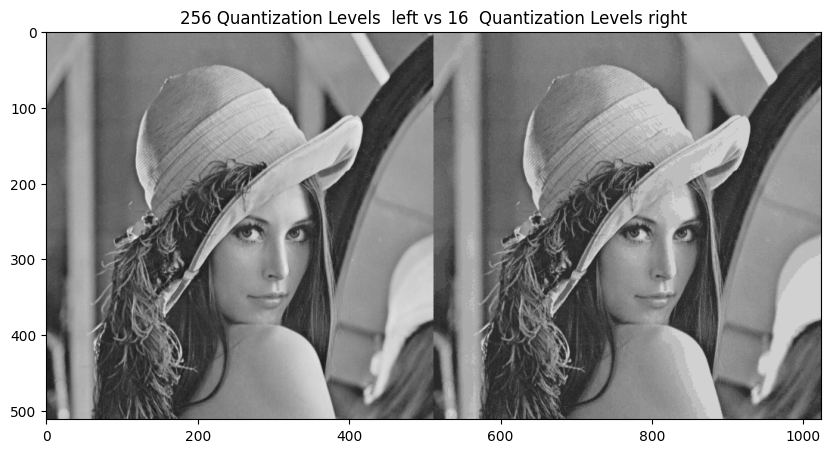

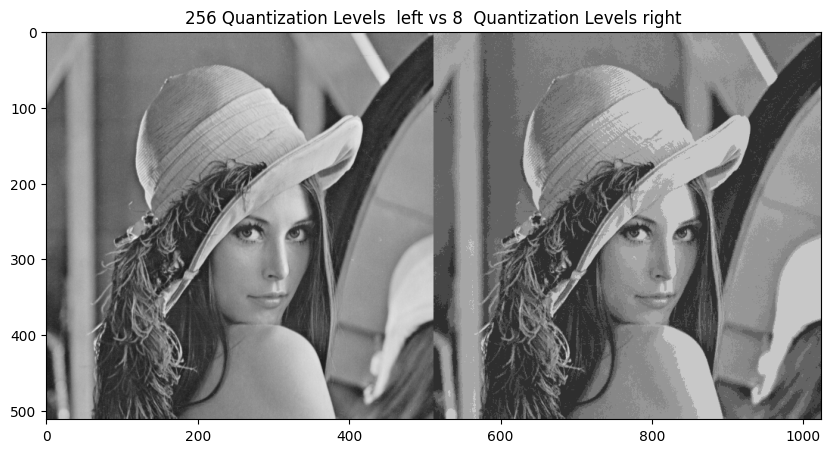

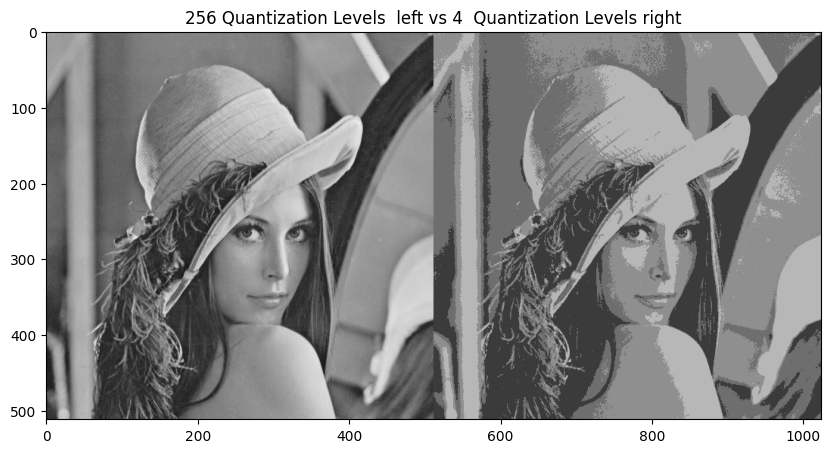

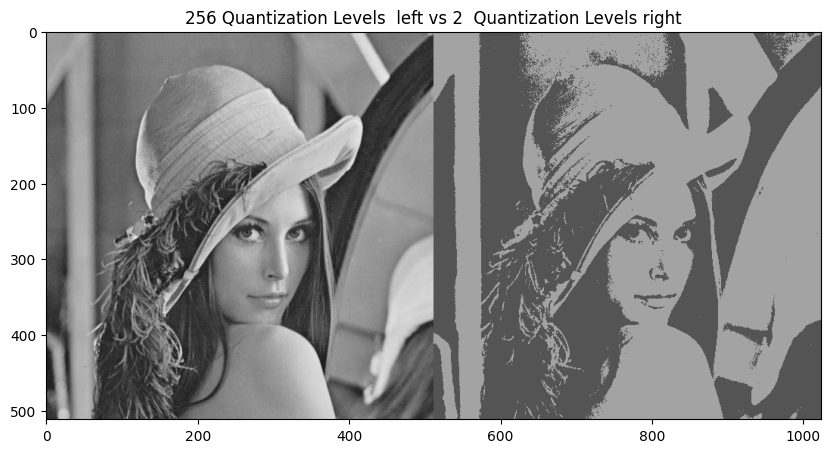

In [21]:
#get_concatc_h(image_gray,image_gray.quantize(256//2)).show(title="Leng")
for n in range(3,8):
  plt.figure(figsize=(10,10))

  plt.imshow(get_concat_h(image_gray, image_gray.quantize(256//2**n)))
  plt.title("256 Quantization Levels  left vs {}  Quantization Levels right".format(256//2**n))
  plt.show()


## Color Channels

We can aslo work with the differnce color channels. Consider the following image:

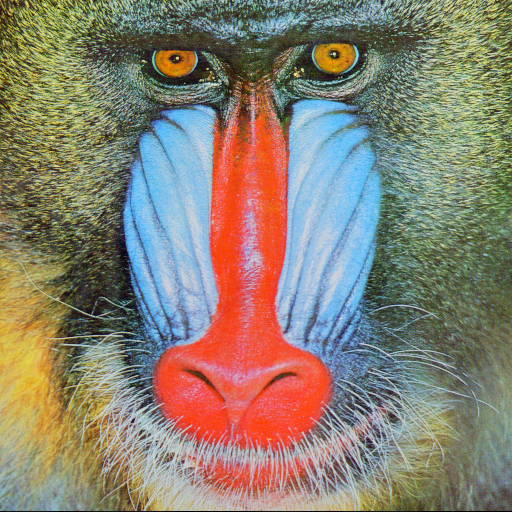

In [22]:
baboon = Image.open("baboon.png")
baboon

We can obtain the difference RGB color channels and assign them to the variables red, green and blue:

In [23]:
red, green, blue = baboon.split()

Plotting the color image next to the red channel as a grayscale, we see that regions with red have higher intensity values.

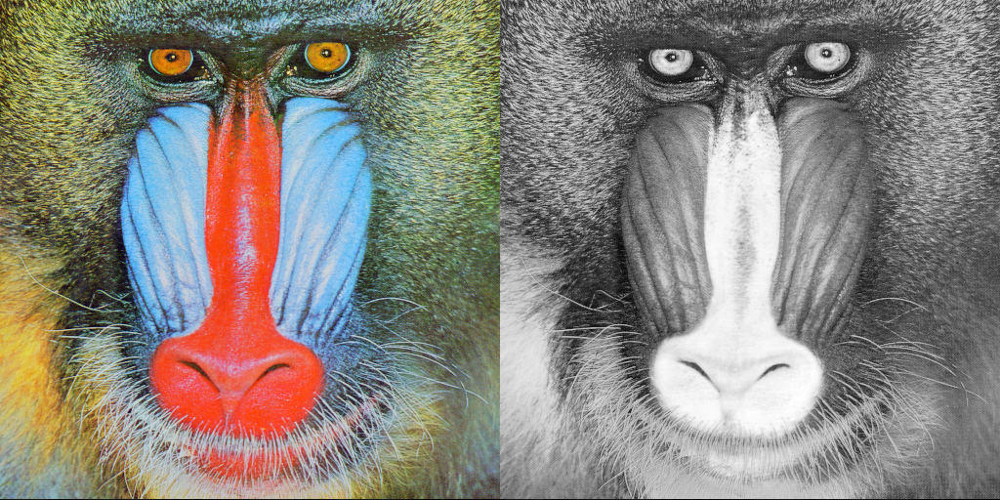

In [24]:
get_concat_h(baboon, red )

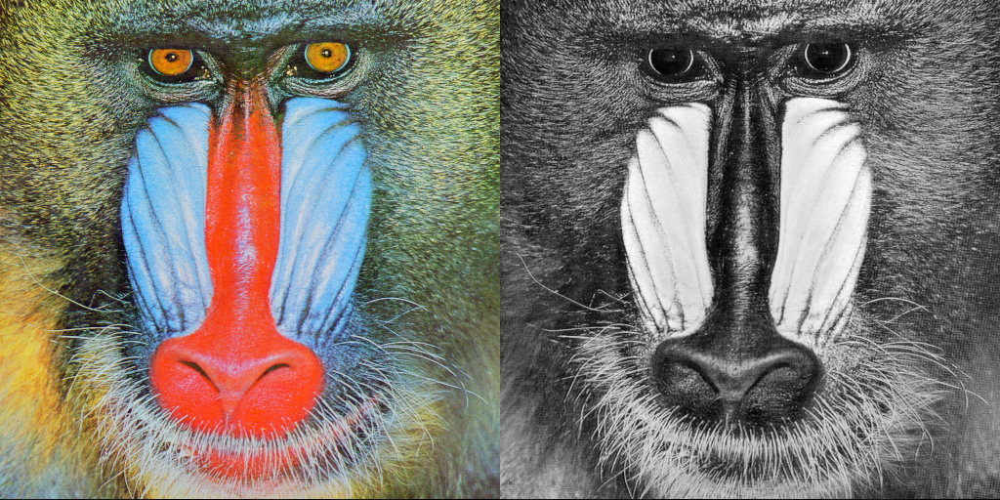

In [25]:
get_concat_h(baboon, blue)

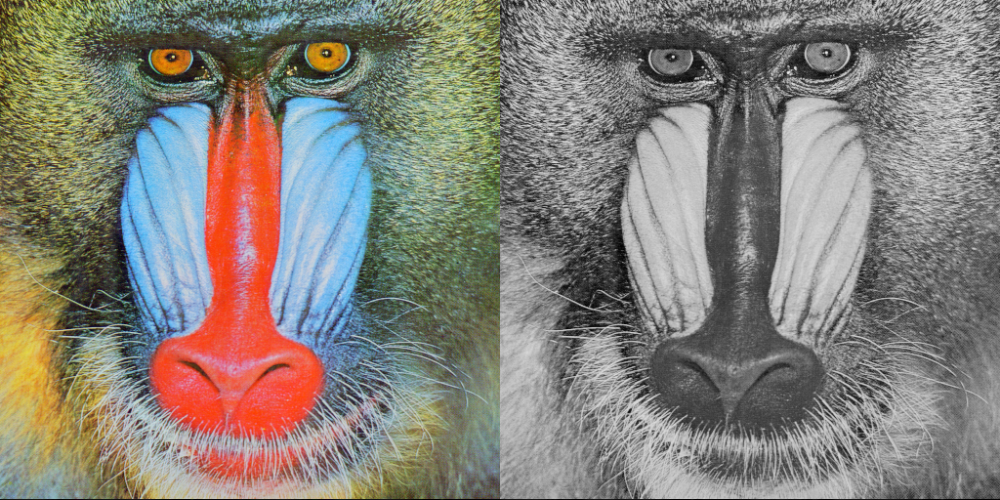

In [26]:
get_concat_h(baboon, green)

## PIL Images into NumPy Arrays
NumPy is a library for Python, allowing you to work with multi-dimensional arrays and matrices. We can convert a PIL image to a NumPy array. We use asarray() or array function from NumPy to convert PIL images into NumPy arrays.

In [27]:
import numpy as np

In [28]:
array = np.asarray(image)
print(type(array))

<class 'numpy.ndarray'>


**np.asarray** turns the original image into a numpy array. Often, we don't want to manipulate the image directly, but instead, create a copy of the image to manipulate. The **np.array** method creates a new copy of the image, such that the original one will remain unmodified.

In [29]:
array = np.array(image)

The attribute shape of a numpy.array object returns a tuple corresponding to the dimensions of it, the first element gives the number of rows or height of the image, the second is element is the number of columns or width of the image. The final element is the number of colour channels.

In [30]:
print(array.shape)

(512, 512, 3)


or (rows, columns, colors). Each element in the color axis corresponds to the following value (R, G, B) format.

We can view the intensity values by printing out the array, they range from 0 to 255 or  28
  (8-bit).

In [31]:
print(array)

[[[226 137 125]
  [226 137 125]
  [223 137 133]
  ...
  [230 148 122]
  [221 130 110]
  [200  99  90]]

 [[226 137 125]
  [226 137 125]
  [223 137 133]
  ...
  [230 148 122]
  [221 130 110]
  [200  99  90]]

 [[226 137 125]
  [226 137 125]
  [223 137 133]
  ...
  [230 148 122]
  [221 130 110]
  [200  99  90]]

 ...

 [[ 84  18  60]
  [ 84  18  60]
  [ 92  27  58]
  ...
  [173  73  84]
  [172  68  76]
  [177  62  79]]

 [[ 82  22  57]
  [ 82  22  57]
  [ 96  32  62]
  ...
  [179  70  79]
  [181  71  81]
  [185  74  81]]

 [[ 82  22  57]
  [ 82  22  57]
  [ 96  32  62]
  ...
  [179  70  79]
  [181  71  81]
  [185  74  81]]]


In [32]:
array[0,0]

array([226, 137, 125], dtype=uint8)

In [33]:
array.min()

3

In [34]:
array.max()

255

## Indexing
You can plot the array as an image:

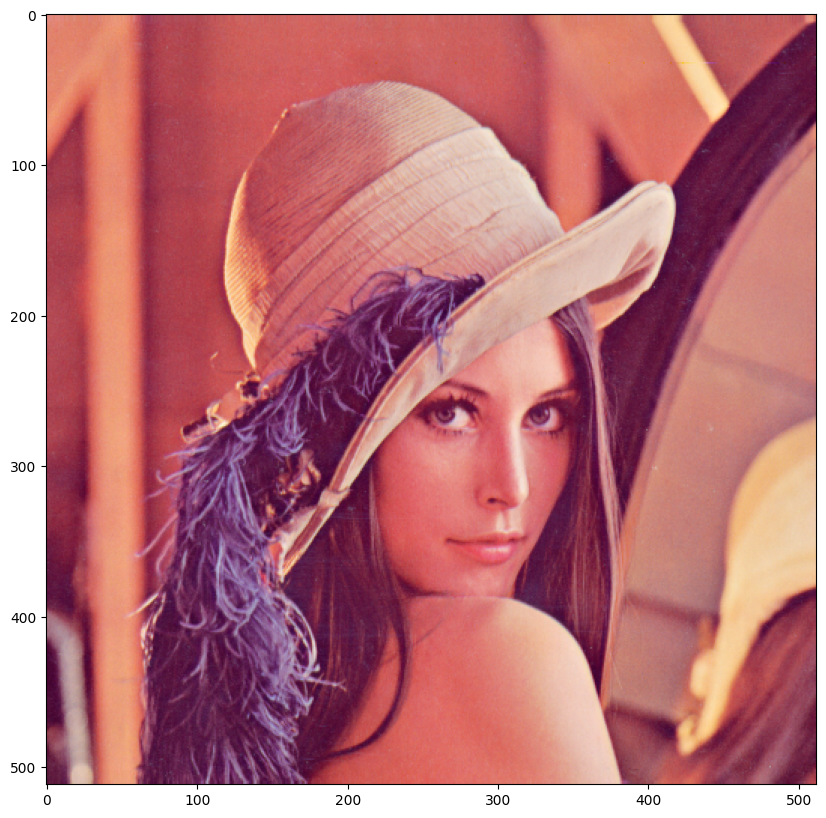

In [35]:
plt.figure(figsize=(10,10))
plt.imshow(array)
plt.show()

We can use numpy slicing, for example, we can return the first 256 rows corresponding to the top half of the image:

In [36]:
rows = 256

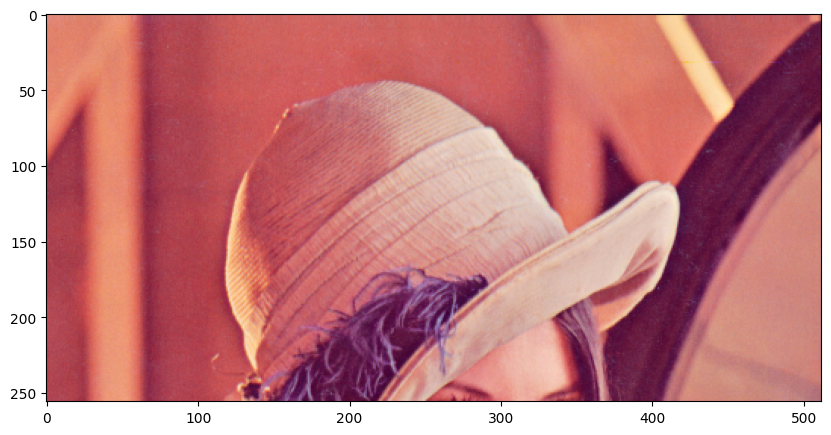

In [37]:
plt.figure(figsize=(10,10))
plt.imshow(array[0:rows,:,:])
plt.show()

In [38]:
columns = 256

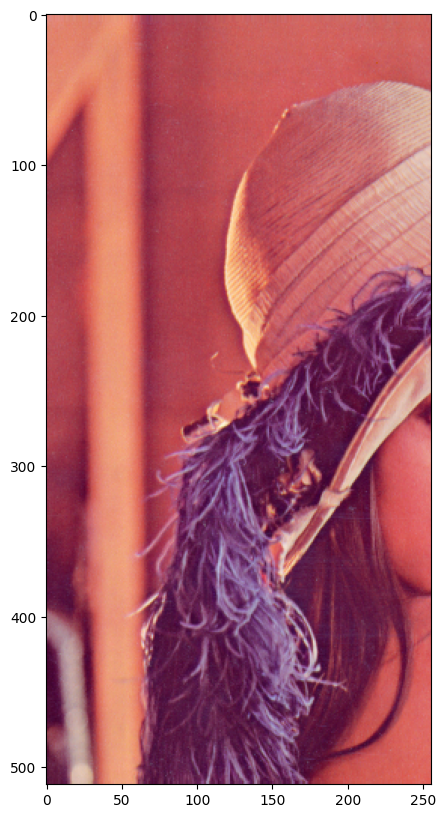

In [39]:
plt.figure(figsize=(10,10))
plt.imshow(array[:,0:columns,:])
plt.show()

If you want to reassign an array to another variable, you should use the copy method

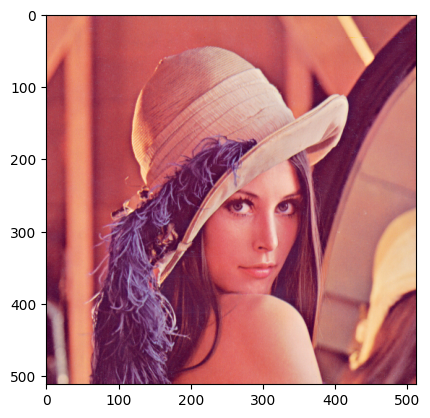

In [40]:
A = array.copy()
plt.imshow(A)
plt.show()

If we do not apply the method copy(), the variable will point to the same location in memory. Consider the array B. If we set all values of array A to zero, as B points to A, the values of B will be zero too:


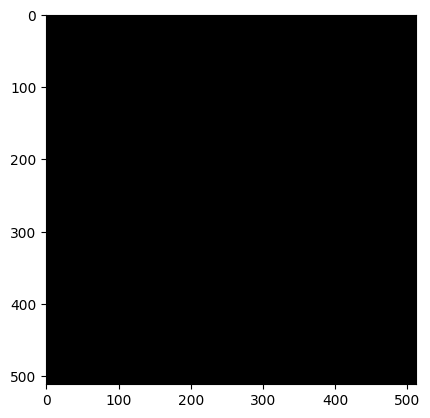

In [41]:
B = A
A[:,:,:] = 0
plt.imshow(B)
plt.show()

We can also work with the different color channels. Consider the baboon image:

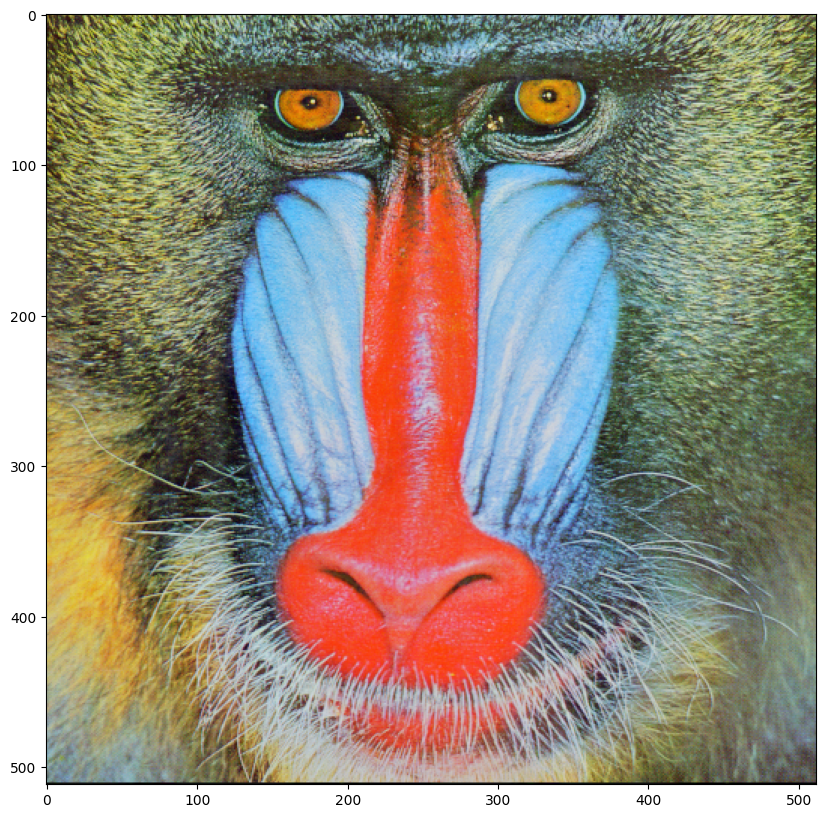

In [42]:
baboon_array = np.array(baboon)
plt.figure(figsize=(10,10))
plt.imshow(baboon_array)
plt.show()

We can plot the red channel as intensity values of the red channel.

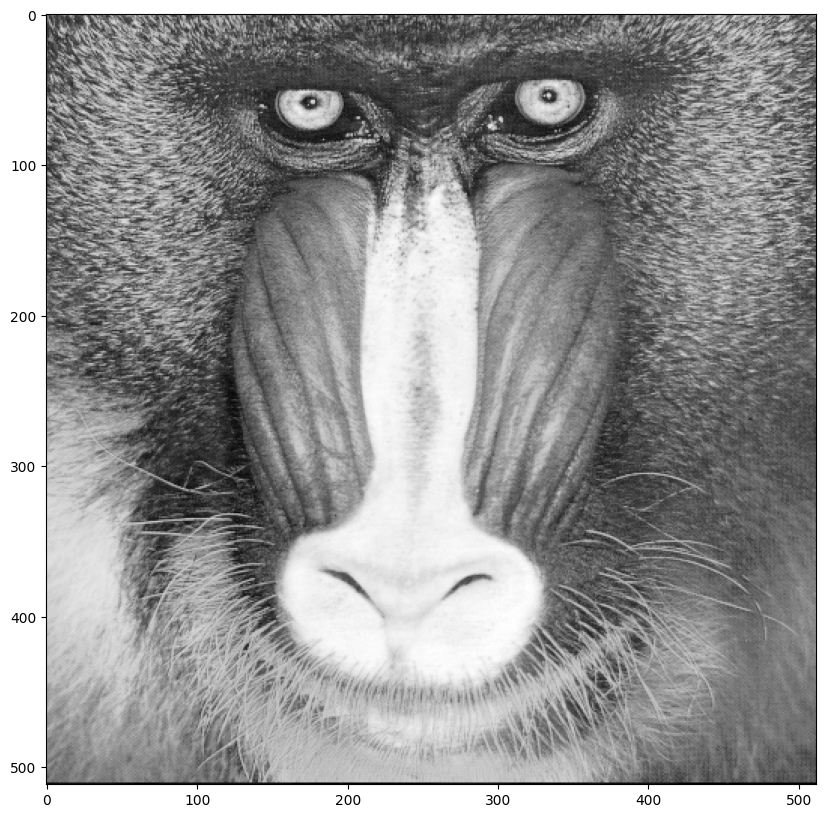

In [43]:
baboon_array = np.array(baboon)
plt.figure(figsize=(10,10))
plt.imshow(baboon_array[:,:,0], cmap='gray')
plt.show()

Or we can create a new array and set all but the red color channels to zero. Therefore, when we display the image it appears red:

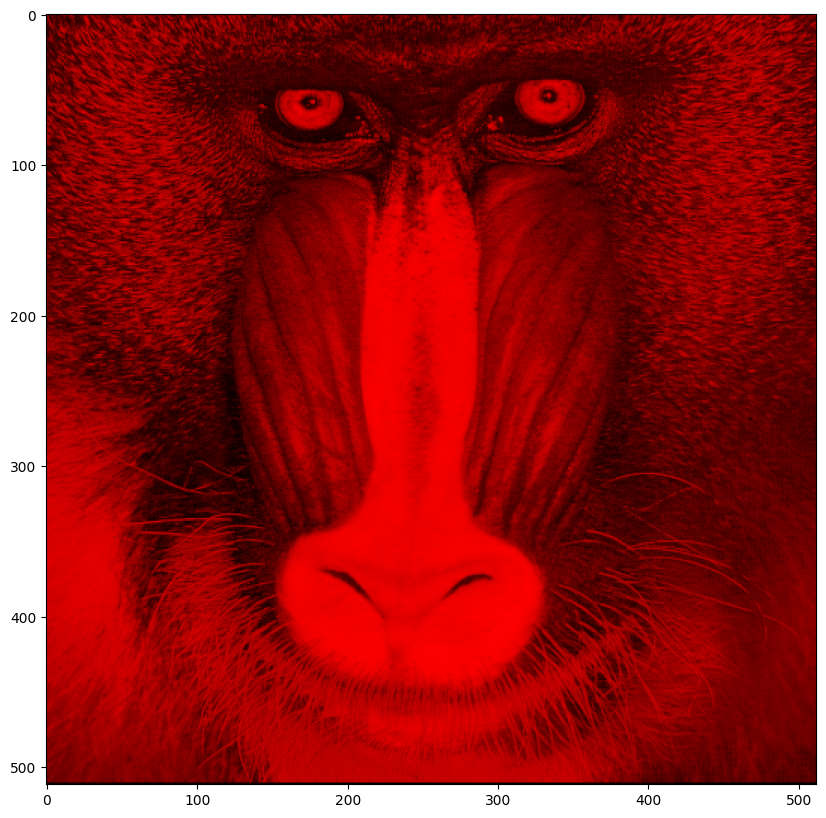

In [44]:
baboon_red=baboon_array.copy()
baboon_red[:,:,1] = 0
baboon_red[:,:,2] = 0
plt.figure(figsize=(10,10))
plt.imshow(baboon_red)
plt.show()

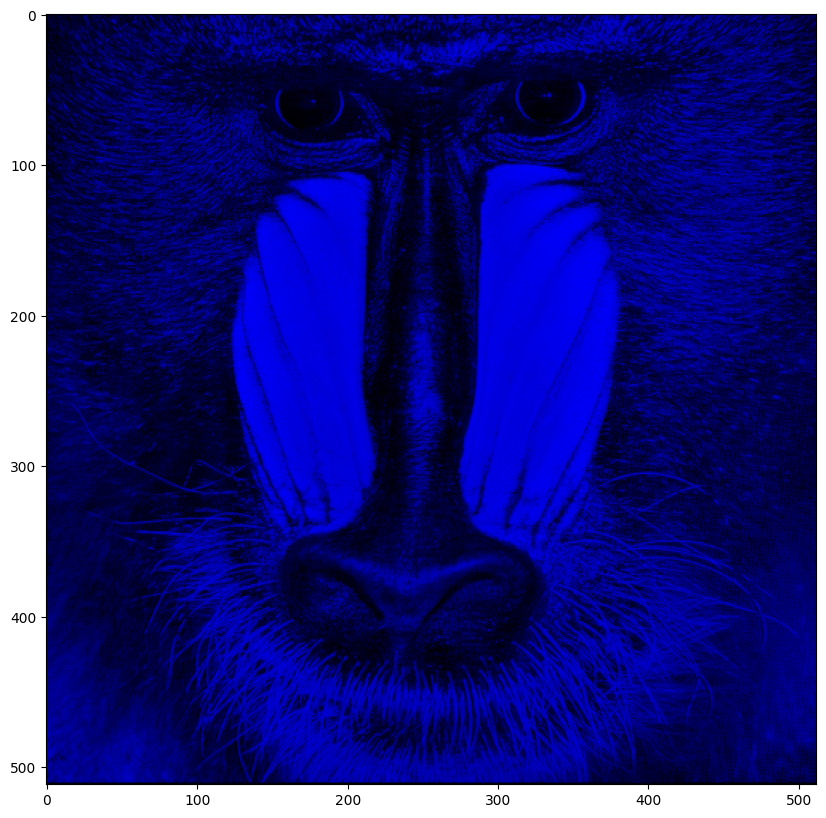

In [45]:
baboon_blue=baboon_array.copy()
baboon_blue[:,:,0] = 0
baboon_blue[:,:,1] = 0
plt.figure(figsize=(10,10))
plt.imshow(baboon_blue)
plt.show()